In [1]:
import os
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from scipy.stats import poisson

from graspy.embed import OmnibusEmbed, selectSVD
from graspy.models import DCSBMEstimator, SBMEstimator
from graspy.utils import (
    augment_diagonal,
    binarize,
    pass_to_ranks,
    remove_loops,
    to_laplace,
)
from src.cluster import BinaryCluster
from src.data import load_metagraph
from src.graph import MetaGraph
from src.hierarchy import signal_flow
from src.io import savecsv, savefig
from src.utils import get_paired_inds
from src.visualization import (
    CLASS_COLOR_DICT,
    add_connections,
    adjplot,
    plot_color_labels,
    plot_double_dendrogram,
    plot_single_dendrogram,
)
from sklearn.decomposition import FastICA, NMF
from sklearn.neighbors import NearestNeighbors
from karateclub import SymmNMF

In [2]:
rc_dict = {
    "axes.spines.right": False,
    "axes.spines.top": False,
    "axes.formatter.limits": (-3, 3),
    "figure.figsize": (6, 3),
    "figure.dpi": 100,
    "axes.edgecolor": "lightgrey",
    "ytick.color": "grey",
    "xtick.color": "grey",
    "axes.labelcolor": "dimgrey",
    "text.color": "dimgrey",
}
for key, val in rc_dict.items():
    mpl.rcParams[key] = val
context = sns.plotting_context(context="talk", font_scale=1, rc=rc_dict)
sns.set_context(context)

np.random.seed(8888)

In [3]:
os.chdir('/Users/TingshanLiu/Desktop/2020 summer/TL_maggot/maggot_repo')

graph_type = "G"
master_mg = load_metagraph(graph_type)
mg = master_mg.remove_pdiff()
meta = mg.meta

degrees = mg.calculate_degrees()
quant_val = np.quantile(degrees["Total edgesum"], 0.05)
idx = meta[degrees["Total edgesum"] > quant_val].index
print(quant_val)
mg = mg.reindex(idx, use_ids=True)

idx = mg.meta[mg.meta["hemisphere"].isin(["L", "R"])].index
mg = mg.reindex(idx, use_ids=True)

idx = mg.meta[mg.meta["pair"].isin(mg.meta.index)].index
mg = mg.reindex(idx, use_ids=True)

mg = mg.make_lcc()
mg.calculate_degrees(inplace=True)

meta = mg.meta
meta["pair_td"] = meta["pair_id"].map(meta.groupby("pair_id")["Total degree"].mean())
mg = mg.sort_values(["pair_td", "pair_id"], ascending=False)
meta["inds"] = range(len(meta))
adj = mg.adj.copy()
lp_inds, rp_inds = get_paired_inds(meta)
left_inds = meta[meta["left"]]["inds"]

print(f"Neurons left after preprocessing: {len(mg)}")

10.0
Neurons left after preprocessing: 2322


In [4]:
graph_types = ["Gad", "Gaa", "Gdd", "Gda"]
adjs = []
for g in graph_types:
    temp_mg = load_metagraph(g)

    temp_mg.reindex(mg.meta.index, use_ids=True)
    temp_adj = temp_mg.adj
    adjs.append(temp_adj)

n_omni_components = 8  
n_svd_components = 16 

def svd(X, n_components=n_svd_components):
    return selectSVD(X, n_components=n_components, algorithm="full")[0]

In [8]:
full_adjs = [
    adj[np.ix_(lp_inds, lp_inds)],
    adj[np.ix_(lp_inds, rp_inds)],
    adj[np.ix_(rp_inds, rp_inds)],
    adj[np.ix_(rp_inds, lp_inds)],
]

In [ ]:
# OMNI + ASE

In [5]:
def preprocess_adjs(adjs, method = 'ase'):

    adjs = [pass_to_ranks(a) for a in adjs]
    adjs = [a + 1 / a.size for a in adjs]
    if method == "ase":
        adjs = [augment_diagonal(a) for a in adjs]
    elif method == "lse":  
        adjs = [to_laplace(a) for a in adjs]
    return adjs

In [6]:
def omni_ASE(
    adjs,
    n_components=4,
    remove_first=None,
    concat_graphs=True,
    concat_directed=True,
    method="ase",
):

    adjs = preprocess_adjs(adjs, method=method)
    omni = OmnibusEmbed(n_components=n_components, check_lcc=False, n_iter=10)
    embed = omni.fit_transform(adjs)
    if concat_directed:
        embed = np.concatenate(
            embed, axis=-1
        )  
    if remove_first is not None:
        embed = embed[remove_first:]
    if concat_graphs:
        embed = np.concatenate(embed, axis=0)
    return embed

In [9]:
out_embed, in_embed = omni_ASE(
    full_adjs,
    n_components=n_omni_components,
    remove_first=None,
    concat_graphs=False,
    concat_directed=False,
    method='ase',
)

left_embed = np.concatenate(
    (out_embed[0], out_embed[1], in_embed[0], in_embed[3]), axis=1
)
right_embed = np.concatenate(
    (out_embed[2], out_embed[3], in_embed[2], in_embed[1]), axis=1
)
omni_iso_embed = np.concatenate((left_embed, right_embed), axis=0)

svd_embed_ASE = svd(omni_iso_embed)

In [ ]:
# OMNI + ICA

In [10]:
def preprocess_adjs(adjs):

    adjs = [pass_to_ranks(a) for a in adjs]
    adjs = [a + 1 / a.size for a in adjs]

    return adjs

In [11]:
def get_omni_matrix(graphs):

    shape = graphs[0].shape
    n = shape[0]  
    m = len(graphs)  

    A = np.array(graphs, copy=False, ndmin=3)

    out = (A[:, :, None, :] + A.transpose(1, 0, 2)[None, :, :, :]).reshape(n * m, -1)
    out /= 2

    return out

In [223]:
def omni_ICA(
    adjs,
    n_components
):

    adjs = preprocess_adjs(adjs)
    omni_matrix = get_omni_matrix(adjs)
    ica = FastICA(algorithm = "parallel", max_iter=50, n_components= n_components)
    embed = ica.fit_transform(omni_matrix)

    return embed

In [224]:
embed = omni_ICA(full_adjs, n_components = 16)
length = len(embed) // 4 
left_embed = np.concatenate(
    (embed[:length,:], embed[length:length*2,:]), axis = 1
)
right_embed = np.concatenate(
    (embed[length*2:length*3,:], embed[length*3:,:]), axis = 1
)
omni_iso_embed = np.concatenate((left_embed, right_embed), axis=0)
svd_embed_ICA = svd(omni_iso_embed)

In [ ]:
# OMNI + NMF

In [221]:
def omni_NMF(adjs, n_components):

    adjs = preprocess_adjs(adjs)
    omni_matrix = get_omni_matrix(adjs)
    nmf = NMF(init='random', random_state=0, max_iter=300, n_components= n_components)
    embed = nmf.fit_transform(omni_matrix)

    return embed

In [245]:
embed = omni_NMF(full_adjs, n_components = 16)
length = len(embed) // 4 
left_embed = np.concatenate(
    (embed[:length,:], embed[length:length*2,:]), axis = 1
)
right_embed = np.concatenate(
    (embed[length*2:length*3,:], embed[length*3:,:]), axis = 1
)
omni_iso_embed = np.concatenate((left_embed, right_embed), axis=0)
svd_embed_NMF = svd(omni_iso_embed)

In [ ]:
# omni + SymmNMF

In [204]:
def omni_SymmNMF(adjs, n_components):

    adjs = preprocess_adjs(adjs)
    omni_matrix = get_omni_matrix(adjs)
    symm_nmf = SymmNMF(dimensions = n_components, iterations= 20)
    embed = symm_nmf.get_embedding(omni_matrix)

    return embed

In [ ]:
# plot pair embeddings

In [225]:
def plot_pairs(
    X, labels, model=None, left_pair_inds=None, right_pair_inds=None, equal=False
):

    n_dims = X.shape[1]

    fig, axs = plt.subplots(
        n_dims, n_dims, sharex=False, sharey=False, figsize=(20, 20)
    )
    data = pd.DataFrame(data=X)
    data["label"] = labels

    for i in range(n_dims):
        for j in range(n_dims):
            ax = axs[i, j]
            ax.axis("off")
            if i < j:
                sns.scatterplot(
                    data=data,
                    x=j,
                    y=i,
                    ax=ax,
                    alpha=0.7,
                    linewidth=0,
                    s=8,
                    legend=False,
                    hue="label",
                    palette=CLASS_COLOR_DICT,
                )
                if left_pair_inds is not None and right_pair_inds is not None:
                    add_connections(
                        data.iloc[left_pair_inds, j],
                        data.iloc[right_pair_inds, j],
                        data.iloc[left_pair_inds, i],
                        data.iloc[right_pair_inds, i],
                        ax=ax,
                    )

    plt.tight_layout()
    return fig, axs

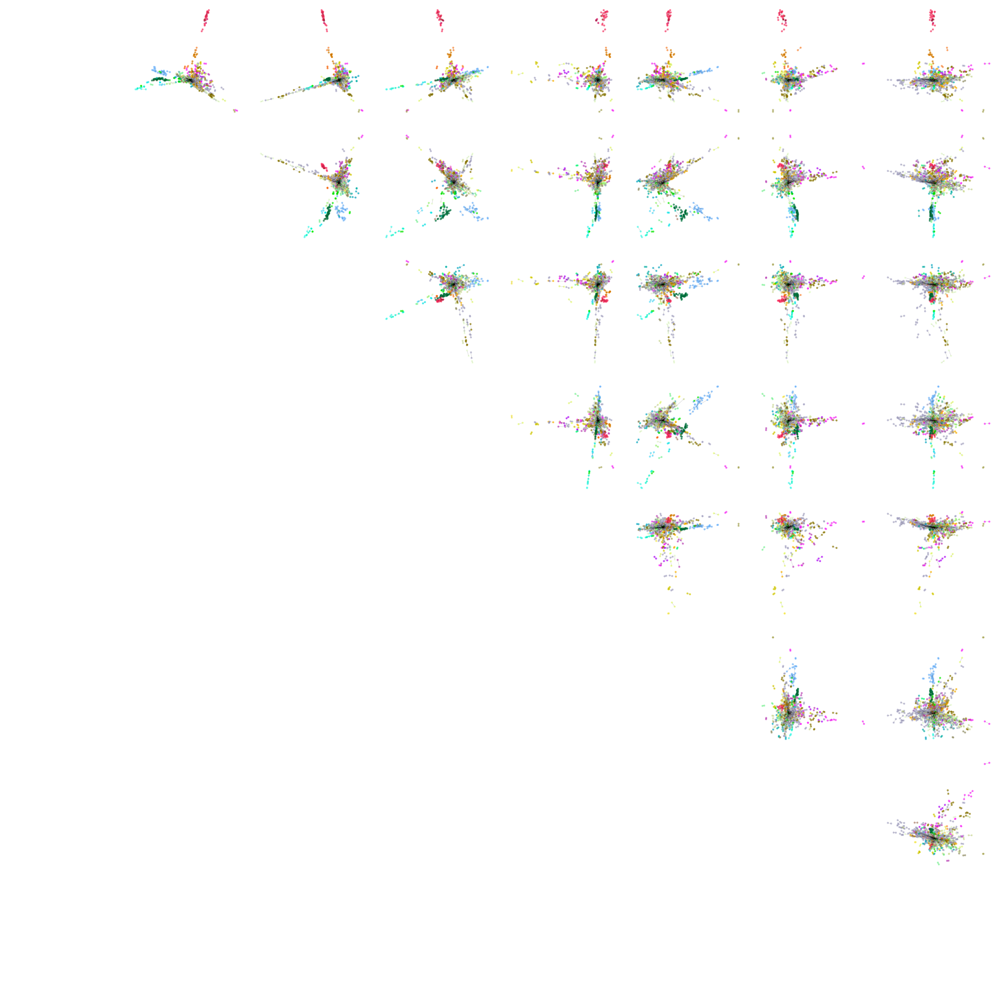

In [265]:
n_pairs = len(lp_inds)
new_lp_inds = np.arange(n_pairs)
new_rp_inds = np.arange(n_pairs) + n_pairs
new_meta = meta.iloc[np.concatenate((lp_inds, rp_inds), axis=0)].copy()
labels = new_meta["merge_class"].values

plot_pairs(
    svd_embed_ICA[:, :8], labels, left_pair_inds=new_lp_inds, right_pair_inds=new_rp_inds
)
plt.show()
#stashfig('NMF-pair_projs-OmniDim=8-NMFDim=16')
#plt.close()

In [15]:
# compare embeddings - kNN at fixed svd_components for ICA

In [39]:
n_svd_components = 8
n_components = np.arange(8, 16)
k = 1
dfs = []

for d in n_components:
    embed = omni_ICA(full_adjs, n_components = d)
    length = len(embed) // 4 
    left_embed = np.concatenate(
        (embed[:length,:], embed[length:length*2,:]), axis = 1
    )
    right_embed = np.concatenate(
        (embed[length*2:length*3,:], embed[length*3:,:]), axis = 1
    )
    omni_iso_embed = np.concatenate((left_embed, right_embed), axis=0)
    svd_embed_ICA = svd(omni_iso_embed)
    p_at_k = compute_neighbors_at_k(svd_embed_ICA, new_lp_inds, new_rp_inds, k_max = k)
    neighbor_df = p_at_k.to_frame()
    neighbor_df.reset_index(inplace=True)
    neighbor_df["d"] = d
    dfs.append(neighbor_df)
neighbor_df = pd.concat(dfs, ignore_index=True)

In [37]:
neighbor_df1 = neighbor_df

Saved figure to /Users/TingshanLiu/Desktop/2020 summer/TL_maggot/maggot_models/outs/ICAdims-SVDdim=8-p_at_k=1.png


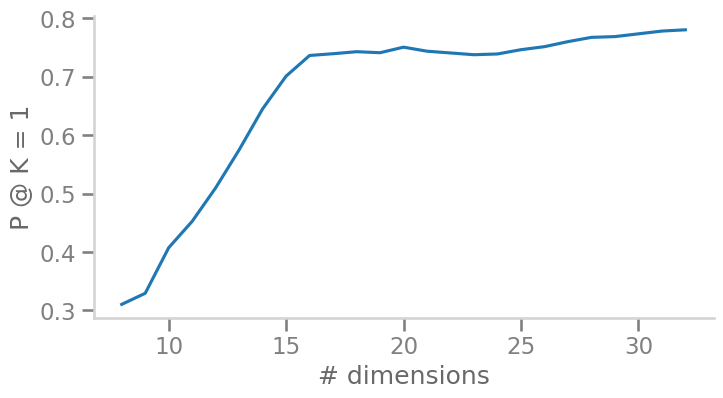

In [50]:
fig, ax = plt.subplots(1, 1, figsize=(8, 4))
sns.lineplot(
    data=pd.concat([neighbor_df, neighbor_df1]),
    x="d",
    y="p_at_k",
    #hue="method",
    #style="method",
)
ax.set_ylabel(f"P @ K = {k}")
ax.set_xlabel("# dimensions")
stashfig("ICAdims-SVDdim=8-p_at_k=1")

In [48]:
from pathlib import Path
def savefig(
    name,
    fmt="png",
    dpi=300,
    foldername=None,
    subfoldername="outs",
    pathname="/Users/TingshanLiu/Desktop/2020 summer/TL_maggot",
    bbox_inches="tight",
    pad_inches=0.5,
    save_on=True,
    transparent=False,
    **kws,
):
    if save_on:
        path = _handle_dirs(pathname, foldername, subfoldername)
        savename = path / str(name + "." + fmt)
        plt.savefig(
            savename,
            format=fmt,
            facecolor="white",
            transparent=transparent,
            bbox_inches=bbox_inches,
            pad_inches=pad_inches,
            dpi=dpi,
            **kws,
        )
        print(f"Saved figure to {savename}")

def _handle_dirs(pathname, foldername, subfoldername):
    path = Path(pathname)
    if foldername is not None:
        path = path / foldername
        if not os.path.isdir(path):
            os.mkdir(path)
        if subfoldername is not None:
            path = path / subfoldername
            if not os.path.isdir(path):
                os.mkdir(path)
    return path

FNAME = os.path.basename('/Users/TingshanLiu/Desktop/2020 summer/TL_maggot/maggot_repo/maggot_models')

def stashfig(name, **kws):
    savefig(name, foldername = FNAME, save_on = True, **kws)
    
def stashcsv(df, name, **kws):
    savecsv(df, name, foldername=FNAME, **kws)

In [ ]:
# compare embeddings - kNN at fixed svd_components for NMF

In [266]:
n_svd_components = 8
n_components = np.arange(8, 33)
k = 1
dfs = []

for d in n_components:
    embed = omni_NMF(full_adjs, n_components = d)
    length = len(embed) // 4 
    left_embed = np.concatenate(
        (embed[:length,:], embed[length:length*2,:]), axis = 1
    )
    right_embed = np.concatenate(
        (embed[length*2:length*3,:], embed[length*3:,:]), axis = 1
    )
    omni_iso_embed = np.concatenate((left_embed, right_embed), axis=0)
    svd_embed_NMF = svd(omni_iso_embed)
    p_at_k = compute_neighbors_at_k(svd_embed_NMF, new_lp_inds, new_rp_inds, k_max = k)
    neighbor_df = p_at_k.to_frame()
    neighbor_df.reset_index(inplace=True)
    neighbor_df["d"] = d
    dfs.append(neighbor_df)
neighbor_df = pd.concat(dfs, ignore_index=True)

Saved figure to /Users/TingshanLiu/Desktop/2020 summer/TL_maggot/maggot_models/outs/NMFdims-SVDdim=8-p_at_k=1.png


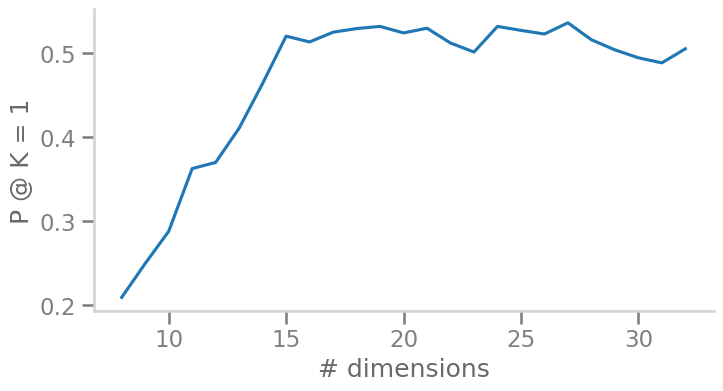

In [60]:
fig, ax = plt.subplots(1, 1, figsize=(8, 4))
sns.lineplot(
    #data=pd.concat([neighbor_df, neighbor_df1]),
    data = neighbor_df,
    x="d",
    y="p_at_k",
    #hue="method",
    #style="method",
)
ax.set_ylabel(f"P @ K = {k}")
ax.set_xlabel("# dimensions")
stashfig("NMFdims-SVDdim=8-p_at_k=1")

In [ ]:
# compare embeddings - kNN

In [63]:
new_lp_inds = np.arange(len(mg) // 2)
new_rp_inds = np.arange(len(mg) // 2) + len(mg) // 2

def compute_neighbors_at_k(X, left_inds, right_inds, k_max, metric="euclidean"):
    nn = NearestNeighbors(radius=0, n_neighbors=k_max + 1, metric=metric)
    nn.fit(X)
    neigh_dist, neigh_inds = nn.kneighbors(X)
    is_neighbor_mat = np.zeros((X.shape[0], k_max), dtype=bool)
    for left_ind, right_ind in zip(left_inds, right_inds):
        left_neigh_inds = neigh_inds[left_ind]
        right_neigh_inds = neigh_inds[right_ind]
        for k in range(k_max):
            if right_ind in left_neigh_inds[: k + 2]:
                is_neighbor_mat[left_ind, k] = True
            if left_ind in right_neigh_inds[: k + 2]:
                is_neighbor_mat[right_ind, k] = True

    neighbors_at_k = np.sum(is_neighbor_mat, axis=0) / is_neighbor_mat.shape[0]
    neighbors_at_k = pd.Series(data=neighbors_at_k, index=np.arange(1, k_max + 1))
    neighbors_at_k.name = "p_at_k"
    return neighbors_at_k

In [69]:
k = 10
names = ["ASE", "ICA", "NMF"]
embeds = [svd_embed_ASE, svd_embed_ICA, svd_embed_NMF]
dims = np.arange(1, 16)
dfs = []
for d in dims:
    for name, embed in zip(names, embeds):
        p_at_k = compute_neighbors_at_k(embed[:, :d], new_lp_inds, new_rp_inds, k_max = k)
        neighbor_df = p_at_k.to_frame()
        neighbor_df.reset_index(inplace=True)
        neighbor_df.rename(columns={"index": "K"}, inplace=True)
        neighbor_df["method"] = name
        neighbor_df["d"] = d
        dfs.append(neighbor_df)
neighbor_df = pd.concat(dfs, ignore_index=True)

Saved figure to /Users/TingshanLiu/Desktop/2020 summer/TL_maggot/maggot_models/outs/ASEdim=8-ICAdim=16-NMFdim=16-SVDdims-p_at_k=10.png


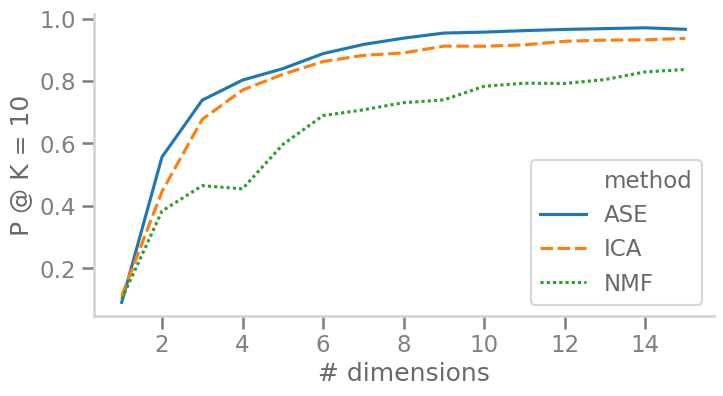

In [70]:
fig, ax = plt.subplots(1, 1, figsize=(8, 4))
sns.lineplot(
    data=neighbor_df[neighbor_df["K"] == k],
    x="d",
    y="p_at_k",
    hue="method",
    style="method",
)
ax.set_ylabel(f"P @ K = {k}")
ax.set_xlabel("# dimensions")
stashfig("ASEdim=8-ICAdim=16-NMFdim=16-SVDdims-p_at_k=10")

In [ ]:
# compare embeddings/ clusterings - homogeneity

In [71]:
from collections import Counter
from math import factorial

def comb(n, r):
    return factorial(n) // factorial(r) // factorial(n-r)

In [120]:
levels = np.arange(0,8)
prob_all = np.zeros([len(levels),2])
def compute_homogeneity(new_meta):
    for l in range(len(levels)):
        sizes = new_meta.groupby(f"lvl{l}_labels").size().values
        groups = new_meta.sort_values(f"lvl{l}_labels").loc[:,"merge_class"]

        cum_sizes = np.cumsum(sizes)
        cum_sizes = np.append(0, cum_sizes)
        prob = np.zeros(len(sizes))
        for j in range(len(sizes)):
            if sizes[j] < 2:
                prob[j] = 1
            else:
                classes = groups.iloc[cum_sizes[j]: cum_sizes[j+1]]
                lis = list(Counter(classes).values())
                num = 0
                for i in range(len(lis)):
                    if lis[i] > 1:
                        num = num + comb(lis[i], 2)
                den = comb(sizes[j], 2)
                prob[j] = num / den

        prob_all[l,0] = np.mean(prob)
        prob_all[l,1] = np.dot(prob, sizes) / sum(sizes)
    return prob_all

In [144]:
n_pairs = len(lp_inds)
new_lp_inds = np.arange(n_pairs)
new_rp_inds = np.arange(n_pairs) + n_pairs
new_meta = meta.iloc[np.concatenate((lp_inds, rp_inds), axis=0)].copy()
labels = new_meta["merge_class"].values
n_levels = 7  
metric = "bic"  
bic_ratio = 1 
d = 8 

In [145]:
names = ["ASE", "ICA", "NMF"]
embeds = [svd_embed_ASE, svd_embed_ICA, svd_embed_NMF]

In [146]:
dfs = []

for name, embed in zip(names, embeds):
    X = embed[:, :d]
    new_meta = meta.iloc[np.concatenate((lp_inds, rp_inds), axis=0)].copy()
    mc = BinaryCluster(
        "0",
        adj = adj,
        n_init = 5,  
        meta = new_meta,  
        X = X, 
        bic_ratio = bic_ratio,
        reembed = False,
        min_split = 4,
    )
    mc.fit(n_levels=n_levels, metric=metric)

    inds = np.concatenate((lp_inds, rp_inds))
    new_adj = adj[np.ix_(inds, inds)]
    new_meta = mc.meta
    prob = compute_homogeneity(new_meta)
    prob_df = pd.DataFrame(data = prob)
    prob_df.reset_index(inplace = True)
    prob_df.rename(columns={"index": "l", 0: "mean", 1: "weighted"}, inplace = True)
    prob_df["method"] = name
    dfs.append(prob_df)
    
prob_df = pd.concat(dfs, ignore_index = True)

No `root_inds` were input; assuming this is the root.
No `root_inds` were input; assuming this is the root.
No `root_inds` were input; assuming this is the root.


Saved figure to /Users/TingshanLiu/Desktop/2020 summer/TL_maggot/maggot_models/outs/homogeneity_weighted.png


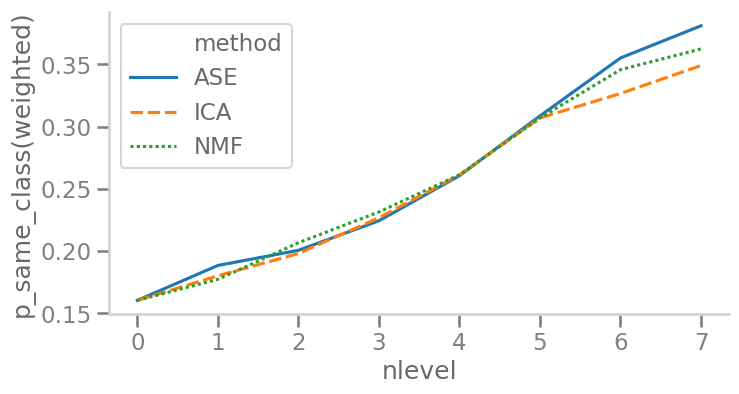

In [193]:
fig, ax = plt.subplots(1, 1, figsize=(8, 4))
sns.lineplot(
    data= prob_df,
    x= "l",
    y="weighted",
    hue="method",
    style="method",
)
ax.set_ylabel("p_same_class(weighted)")
ax.set_xlabel("nlevel")
stashfig('homogeneity_weighted')